In [1]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import librosa
import utils.audio_utils as audio_utils
from utils.utils import save_data
import numpy as np
from scipy.signal import butter, lfilter
from noisereduce import reduce_noise
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
label_dir = '../../recordings_with_tones.csv'
audio_dir = '../../recordings'
data_dir = "data" #saving folder

In [3]:
selected_word_columns_with_embedding = {
    'a0p': 0,   
    'a1p': 1,  
    'a2p': 2,
    'a3p': 3,
    'a4p': 4,
    'a5p': 5,
    'a6p': 6,
    'a7p': 7,
    'a8p': 8,
    'a9p': 9,
    'a10p': 10,
    'a100p': 11
}

### Załadowanie Danych

In [4]:
label_data = pd.read_csv(label_dir)

In [5]:
data_rows = []

In [6]:
for index, row in label_data.iterrows():
    file_id = row['id']
    for key,val in selected_word_columns_with_embedding.items():
        if pd.notnull(row[key]):
            file_path = f'{audio_dir}/stageI/{file_id}/{key[:2]}.wav'
            if os.path.exists(file_path):
                data_rows.append({
                    'path': file_path,
                    'embedding': val,
                    'label': int(row[key])
                })
df = pd.DataFrame(data_rows)

In [7]:
df.head()

,path,embedding,label
0,../../recordings/stageI/8/a0.wav,0,0
1,../../recordings/stageI/8/a1.wav,1,1
2,../../recordings/stageI/8/a2.wav,2,1
3,../../recordings/stageI/8/a3.wav,3,1
4,../../recordings/stageI/8/a4.wav,4,0


In [8]:
df['audio'] = df['path'].apply(lambda x: librosa.load(x, sr=None))

In [9]:
df.head()

,path,embedding,label,audio
0,../../recordings/stageI/8/a0.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,../../recordings/stageI/8/a1.wav,1,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,../../recordings/stageI/8/a2.wav,2,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,../../recordings/stageI/8/a3.wav,3,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,../../recordings/stageI/8/a4.wav,4,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [10]:
audio_utils.display_listenable_audio(df.head(1))

Playing ../../recordings/stageI/8/a0.wav with label 0


In [11]:
print("\nLiczba nagrań:", len(df))


Liczba nagrań: 5985


### Analiza pojedyńczego słowa (selected_embedding)

In [12]:
selected_embedding = 2

filtered_df = df[df['embedding'] == selected_embedding]
label_1_df = filtered_df[filtered_df['label'] == 1]
label_0_df = filtered_df[filtered_df['label'] == 0]
print(f"Poprawne nagrania dla embedding=={selected_embedding}")
audio_utils.display_listenable_audio(label_1_df.sample(n=5, random_state=None))
print(f"Niepoprawne nagrania dla embedding=={selected_embedding}")
audio_utils.display_listenable_audio(label_0_df.sample(n=5, random_state=None))

Poprawne nagrania dla embedding==2
Playing ../../recordings/stageI/154/a2.wav with label 1


Playing ../../recordings/stageI/1088/a2.wav with label 1


Playing ../../recordings/stageI/1375/a2.wav with label 1


Playing ../../recordings/stageI/161/a2.wav with label 1


Playing ../../recordings/stageI/165/a2.wav with label 1


Niepoprawne nagrania dla embedding==2
Playing ../../recordings/stageI/1432/a2.wav with label 0


Playing ../../recordings/stageI/1398/a2.wav with label 0


Playing ../../recordings/stageI/183/a2.wav with label 0


Playing ../../recordings/stageI/550/a2.wav with label 0


Playing ../../recordings/stageI/85/a2.wav with label 0


### Usunięcie nagrań z dużym szumem

In [13]:
noise_threshold = 0.004

In [14]:
df['rms'] = df['audio'].apply(lambda x: np.sqrt(np.mean(np.square(x[0]))))

In [15]:
noisy_df = df[df['rms'] < noise_threshold]
print("\nLiczba nagrań z za dużym szumem:", len(noisy_df))
audio_utils.display_listenable_audio(noisy_df.sample(n=5, random_state=None))


Liczba nagrań z za dużym szumem: 162
Playing ../../recordings/stageI/632/a1.wav with label 0


Playing ../../recordings/stageI/1293/a3.wav with label 0


Playing ../../recordings/stageI/761/a2.wav with label 0


Playing ../../recordings/stageI/1354/a3.wav with label 1


Playing ../../recordings/stageI/587/a6.wav with label 0


In [16]:
df = df[df['rms'] >= noise_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 5823


### Usunięcie krótkich nagrań

In [17]:
duration_seconds_threshold = 0.5

In [18]:
df['duration'] = df['audio'].apply(lambda x: librosa.get_duration(y=x[0], sr=x[1]))

In [19]:
short_df = df[df['duration'] < duration_seconds_threshold]
print("\nLiczba nagrań z za krótkim czasem trwania:", len(short_df))
audio_utils.display_listenable_audio(short_df.sample(n=5, random_state=None))


Liczba nagrań z za krótkim czasem trwania: 8
Playing ../../recordings/stageI/668/a1.wav with label 0


Playing ../../recordings/stageI/668/a7.wav with label 0


Playing ../../recordings/stageI/668/a5.wav with label 0


Playing ../../recordings/stageI/668/a9.wav with label 0


Playing ../../recordings/stageI/668/a1.wav with label 0


In [20]:
df = df[df['duration'] > duration_seconds_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 5815


### Usunięcie ciszy z nagrań

In [21]:
top_db = 30

In [22]:
def remove_silence(audio, sr, top_db=30):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio
df['trimmed_audio'] = df['audio'].apply(lambda x: (remove_silence(x[0], x[1]), x[1]))

In [23]:
audio_utils.display_listenable_audio(df.sample(n=5, random_state=None), ['trimmed_audio'])

Playing ../../recordings/stageI/370/a5.wav with label 0


trimmed_audio


Playing ../../recordings/stageI/1292/a6.wav with label 1


trimmed_audio


Playing ../../recordings/stageI/1315/a5.wav with label 0


trimmed_audio


Playing ../../recordings/stageI/1302/a9.wav with label 0


trimmed_audio


Playing ../../recordings/stageI/639/a1.wav with label 1


trimmed_audio


In [24]:
df['audio'] = df['trimmed_audio']
df = df.drop(columns=['trimmed_audio'])

### Redukcja szumu

In [25]:
noise_profile = 0.5 
lowcut = 80
highcut = 8000

1. Redukcja szumu za pomocą profilowania szumu z początku nagrania

In [26]:


def reduce_noise_in_audio(audio, sr):
    noise_part = audio[:int(noise_profile * sr)]
    return reduce_noise(y=audio, sr=sr, y_noise=noise_part)

df['reduced_audio'] = df['audio'].apply(lambda x: (reduce_noise_in_audio(x[0], x[1]), x[1]))

2. Filtry pasmowe

In [27]:
def butter_bandpass_filter(audio, sr):
    nyquist = 0.5 * sr
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(1, [low, high], btype='band')
    return lfilter(b, a, audio)

df['reduced_audio2'] = df['reduced_audio'].apply(lambda x: (butter_bandpass_filter(x[0], x[1]), x[1]))

3. Redukcja szumu spektrogramu

In [28]:
def spectral_noise_reduction(audio, sr):
    # Tworzenie spektrogramu
    stft = librosa.stft(audio)
    magnitude, phase = librosa.magphase(stft)

    # Średnia amplituda jako próg
    noise_threshold = np.mean(magnitude) * 0.5
    reduced_magnitude = np.where(magnitude > noise_threshold, magnitude, 0)

    # Odwrotna transformacja
    return librosa.istft(reduced_magnitude * phase)

df['reduced_audio3'] = df['reduced_audio2'].apply(lambda x: (spectral_noise_reduction(x[0], x[1]), x[1]))

4. Normalizacja poziomu głośności

In [29]:
def normalize_audio(audio):
    return librosa.util.normalize(audio)

df['reduced_audio4'] = df['reduced_audio3'].apply(lambda x: (normalize_audio(x[0]), x[1]))

In [30]:
audio_utils.display_listenable_audio(df.sample(n=5, random_state=None), ['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

Playing ../../recordings/stageI/727/a3.wav with label 1


reduced_audio


reduced_audio2


reduced_audio3


reduced_audio4


Playing ../../recordings/stageI/1045/a3.wav with label 1


reduced_audio


reduced_audio2


reduced_audio3


reduced_audio4


Playing ../../recordings/stageI/1283/a7.wav with label 0


reduced_audio


reduced_audio2


reduced_audio3


reduced_audio4


Playing ../../recordings/stageI/952/a1.wav with label 0


reduced_audio


reduced_audio2


reduced_audio3


reduced_audio4


Playing ../../recordings/stageI/108/a9.wav with label 0


reduced_audio


reduced_audio2


reduced_audio3


reduced_audio4


In [31]:
df['audio'] = df['reduced_audio4']
df = df.drop(columns=['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

### Standaryzacja pasma częstotliwości

In [32]:
target_sr = 16000

In [33]:
def resample_audio(audio, sr):
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr)
    return audio, target_sr

df['resampled_audio'] = df['audio'].apply(lambda x: resample_audio(x[0], x[1]))

In [34]:
print("Stare częstotliwości próbkowania:", df['audio'].apply(lambda x: x[1]).unique())
print("Nowe częstotliwości próbkowania:", df['resampled_audio'].apply(lambda x: x[1]).unique())

Stare częstotliwości próbkowania: [48000 44100]
Nowe częstotliwości próbkowania: [16000]


In [35]:
audio_utils.display_listenable_audio(df.sample(n=5, random_state=None), ['resampled_audio'])

Playing ../../recordings/stageI/459/a3.wav with label 0


resampled_audio


Playing ../../recordings/stageI/942/a1.wav with label 1


resampled_audio


Playing ../../recordings/stageI/939/a0.wav with label 1


resampled_audio


Playing ../../recordings/stageI/763/a1.wav with label 1


resampled_audio


Playing ../../recordings/stageI/1383/a8.wav with label 1


resampled_audio


In [36]:
df['audio'] = df['resampled_audio']
df = df.drop(columns=['resampled_audio'])

### Wyrównanie długości nagrań do najdłuższego

In [37]:
df['length_samples'] = df['audio'].apply(lambda x: len(x[0]))
max_length = df['length_samples'].max()
print(f"Najdłuższe nagranie ma {max_length} próbek.")

Najdłuższe nagranie ma 71851 próbek.


In [38]:
def pad_to_max_length(audio, max_length):
    if len(audio) < max_length:
        # Dodaj zera na końcu
        return np.pad(audio, (0, max_length - len(audio)), mode='constant')
    return audio

df['pad_audio'] = df['audio'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

In [39]:
print("Stare długości nagrań:", df['audio'].apply(lambda x: len(x[0])).unique())
print("Nowe długości nagrań:", df['pad_audio'].apply(lambda x: len(x[0])).unique())

Stare długości nagrań: [16214 14507 17920 14166 25600 12971  8022  8704 26624  7680 29014 27819
 28331 23723 20139 24918 29355 26795 10752  5120 11094  9046  8534  6486
  9387 20651 11264 16726  6827  7339 10923 10411  6144  5632  7851  7168
  6656  9216 11435  9558  6998  4779  4267 11606  5974 23382 17750 24064
 30208 27648 25942 18432 13142 17579 31574  4950  5462  9899 22870  6315
 10240 18944 17067 20992 15019  7510 13995 14678 12800 27136 18774 19798
 20480 11947 12459 12288 47275 14848 12630 10582 34134 18262  9728  8363
 13483 17238 22528 22358 14336 16896 19115 11776 27307 12118 21504 16384
 24576 22016 19456  3414  4608 37547 29696 32086 26454 28160 30379 15531
 24235 19286 30720 21334  4096 20310 18603 22187  5803  5291 29867 22699
 21675 15702 13824 23894 23040 15360 31403 28672  8192  8875 21163 17408
 13312 25259 19968  4438 25771 10070 38059 38742 25088 24406 32939  2902
  3584 16555 26966 18091 19627 20822 15190 23552 24747 31232 30550 31915
 35328 27478 16043 36011 402

In [40]:
audio_utils.display_listenable_audio(df.sample(n=5, random_state=None), ['pad_audio'])

Playing ../../recordings/stageI/589/a3.wav with label 1


pad_audio


Playing ../../recordings/stageI/1338/a5.wav with label 1


pad_audio


Playing ../../recordings/stageI/141/a1.wav with label 1


pad_audio


Playing ../../recordings/stageI/1042/a2.wav with label 0


pad_audio


Playing ../../recordings/stageI/374/a1.wav with label 0


pad_audio


In [41]:
df['audio'] = df['pad_audio']
df = df.drop(columns=['pad_audio'])

### Augmentacja

1. Dodanie szumu

In [42]:
noise_level = 0.005

In [43]:
def add_noise(audio):
    noise = noise_level * np.random.normal(0, 1, len(audio))
    return audio + noise

df['augmented1'] = df['audio'].apply(lambda x: (add_noise(x[0]), x[1]))

In [44]:
audio_utils.display_listenable_audio(df.sample(n=3, random_state=None), ['augmented1'])

Playing ../../recordings/stageI/1434/a4.wav with label 1


augmented1


Playing ../../recordings/stageI/1068/a1.wav with label 1


augmented1


Playing ../../recordings/stageI/1361/a8.wav with label 1


augmented1


2. Zmiana szybkości

In [45]:
rate = 1.2

In [46]:
def time_stretch(audio):
    return librosa.effects.time_stretch(audio,rate=rate)

df['augmented2'] = df['audio'].apply(lambda x: (time_stretch(x[0]), x[1]))

In [47]:
audio_utils.display_listenable_audio(df.sample(n=3, random_state=None), ['augmented2'])

Playing ../../recordings/stageI/1330/a6.wav with label 1


augmented2


Playing ../../recordings/stageI/1035/a0.wav with label 1


augmented2


Playing ../../recordings/stageI/149/a6.wav with label 0


augmented2


3. zmiana wysokości tonów

In [48]:
n_steps=2

In [49]:
def pitch_shift(audio, sr):
    return librosa.effects.pitch_shift(audio, sr=sr, n_steps=n_steps)

# Przykład augmentacji
df['augmented3'] = df['audio'].apply(lambda x: (pitch_shift(x[0], x[1]), x[1]))

In [50]:
audio_utils.display_listenable_audio(df.sample(n=3, random_state=None), ['augmented3'])

Playing ../../recordings/stageI/1024/a6.wav with label 0


augmented3


Playing ../../recordings/stageI/715/a3.wav with label 1


augmented3


Playing ../../recordings/stageI/200/a1.wav with label 0


augmented3


4. Zmiana głośności

In [51]:
factor = 1.5

In [52]:
def change_volume(audio):
    return audio * factor

df['augmented4'] = df['audio'].apply(lambda x: (change_volume(x[0]), x[1]))

In [53]:
audio_utils.display_listenable_audio(df.sample(n=3, random_state=None), ['augmented4'])

Playing ../../recordings/stageI/47/a1.wav with label 0


augmented4


Playing ../../recordings/stageI/553/a6.wav with label 0


augmented4


Playing ../../recordings/stageI/968/a9.wav with label 1


augmented4


### Zbalansowanie klas

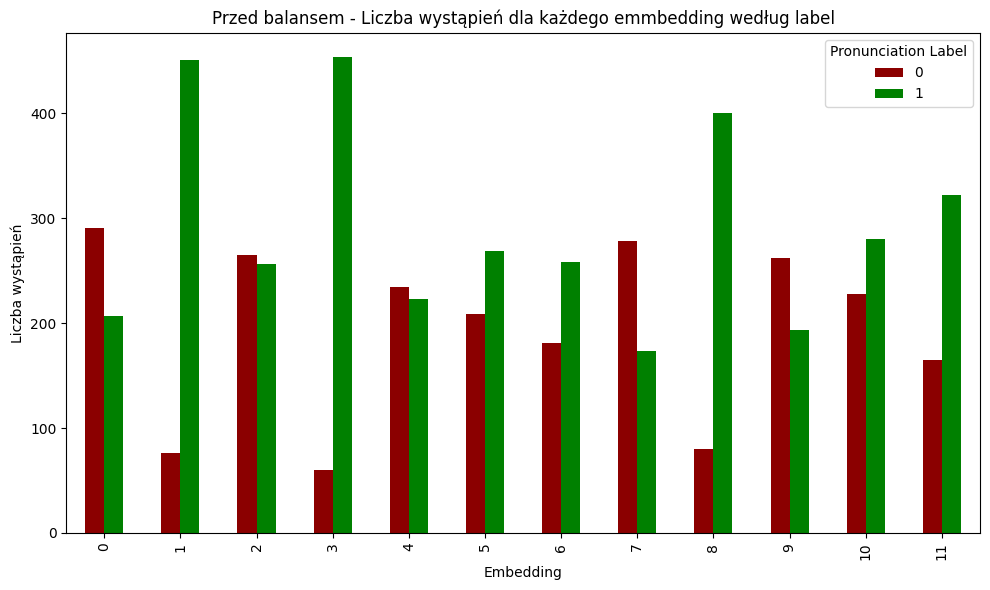

In [54]:
grouped_data = df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Przed balansem - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()

In [55]:
def balance_classes(data):
    balanced_data = []
    for word in data['embedding'].unique():
        subset = data[data['embedding'] == word]
        class_0 = subset[subset['label'] == 0]
        class_1 = subset[subset['label'] == 1]
        
        # Znajdź minimalną liczebność między klasami
        min_size = min(len(class_0), len(class_1))
        
        # Losowy wybór próbek do wyrównania
        class_0_balanced = class_0.sample(n=min_size, random_state=42)
        class_1_balanced = class_1.sample(n=min_size, random_state=42)
        
        # Dodaj zbalansowane dane do listy
        balanced_data.append(class_0_balanced)
        balanced_data.append(class_1_balanced)
    
    # Połącz wszystkie zbalansowane dane w jeden DataFrame
    return pd.concat(balanced_data).reset_index(drop=True)\

balanced_df = balance_classes(df)

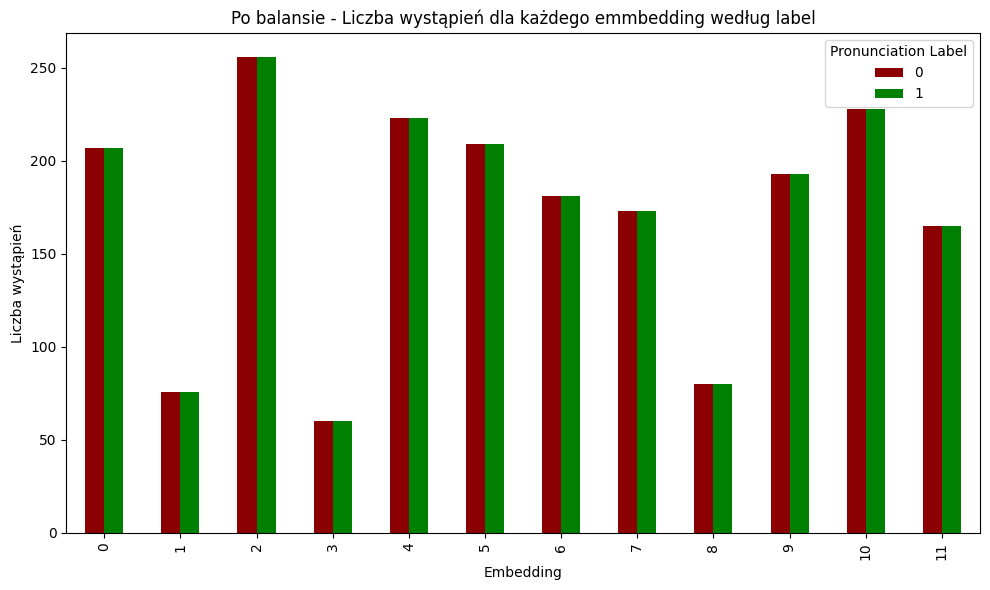

In [78]:
grouped_data = balanced_df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Po balansie - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()


### Ekstrakcja MFCC

In [57]:
def extract_mfcc(audio, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc)
    return mfcc.T
balanced_df['mfcc'] = balanced_df['audio'].apply(lambda x: extract_mfcc(x[0], x[1]))
balanced_df['mfcc_augmented1'] = balanced_df['augmented1'].apply(lambda x: extract_mfcc(x[0], x[1]))
balanced_df['mfcc_augmented2'] = balanced_df['augmented2'].apply(lambda x: extract_mfcc(x[0], x[1]))
balanced_df['mfcc_augmented3'] = balanced_df['augmented3'].apply(lambda x: extract_mfcc(x[0], x[1]))
balanced_df['mfcc_augmented4'] = balanced_df['augmented4'].apply(lambda x: extract_mfcc(x[0], x[1]))

### Podział na zbiór treningowy, walidacyjny i testowy

In [82]:
train_df, temp_df = train_test_split(balanced_df, test_size=0.4, random_state=42, stratify=balanced_df['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['label'])

In [83]:
X_train = train_df['mfcc'].tolist()
word_indices_train = train_df['embedding'].tolist()
y_train = train_df['label'].tolist()

X_val = val_df['mfcc'].tolist()
word_indices_val = val_df['embedding'].tolist()
y_val = val_df['label'].tolist()

X_test = test_df['mfcc'].tolist()
word_indices_test = test_df['embedding'].tolist()
y_test = test_df['label'].tolist()

In [84]:
X_augmented = train_df['mfcc_augmented1'].tolist() + train_df['mfcc_augmented2'].tolist() + train_df['mfcc_augmented3'].tolist() + train_df['mfcc_augmented4'].tolist()
word_indices_augmented = word_indices_train + word_indices_train + word_indices_train + word_indices_train
y_augmented = y_train + y_train + y_train + y_train

In [85]:

def pad_or_trim_mfcc(mfcc, max_length):
    if mfcc.shape[0] < max_length:
        # Padding zerami
        padding = np.zeros((max_length - mfcc.shape[0], mfcc.shape[1]))
        return np.vstack([mfcc, padding])
    else:
        # Przycięcie
        return mfcc[:max_length, :] 
label_encoder = LabelEncoder()


max_length = max(mfcc.shape[0] for mfcc in X_train)
X_train = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_train])
X_train = X_train[..., np.newaxis]
word_indices_train = np.array(word_indices_train)
y_train = np.array(y_train)
y_train = label_encoder.fit_transform(y_train)

max_length = max(mfcc.shape[0] for mfcc in X_val)
X_val = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_val])
X_val = X_val[..., np.newaxis]
word_indices_val = np.array(word_indices_val)
y_val = np.array(y_val)
y_val = label_encoder.fit_transform(y_val)

max_length = max(mfcc.shape[0] for mfcc in X_test)
X_test = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_test])
X_test = X_test[..., np.newaxis]
word_indices_test = np.array(word_indices_test)
y_test = np.array(y_test)
y_test = label_encoder.fit_transform(y_test)

max_length = max(mfcc.shape[0] for mfcc in X_augmented)
X_augmented = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_augmented])
X_augmented = X_augmented[..., np.newaxis]
word_indices_augmented = np.array(word_indices_augmented)
y_augmented = np.array(y_augmented)
y_augmented = label_encoder.fit_transform(y_augmented)

In [87]:
print(f"Rozmiar zbioru treningowego: {X_train.shape}")
print(f"Rozmiar zbioru walidacyjnego: {X_val.shape}")
print(f"Rozmiar zbioru testowego: {X_test.shape}")

Rozmiar zbioru treningowego: (2461, 141, 13, 1)
Rozmiar zbioru walidacyjnego: (820, 141, 13, 1)
Rozmiar zbioru testowego: (821, 141, 13, 1)


In [88]:
X_train_with_augmented = np.concatenate((X_train, X_augmented), axis=0)
word_indices_train_with_augmented = np.concatenate((word_indices_train, word_indices_augmented), axis=0)
y_train_with_augmented = np.concatenate((y_train, y_augmented), axis=0)
print(f"Rozmiar zbioru treningowego po dodaniu augemntacji: {X_train_with_augmented.shape}")


Rozmiar zbioru treningowego po dodaniu augemntacji: (12305, 141, 13, 1)


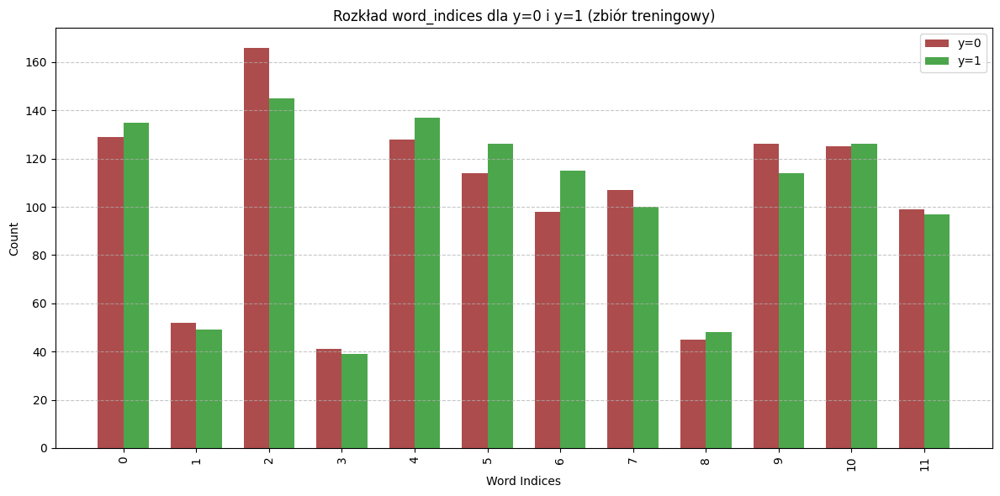

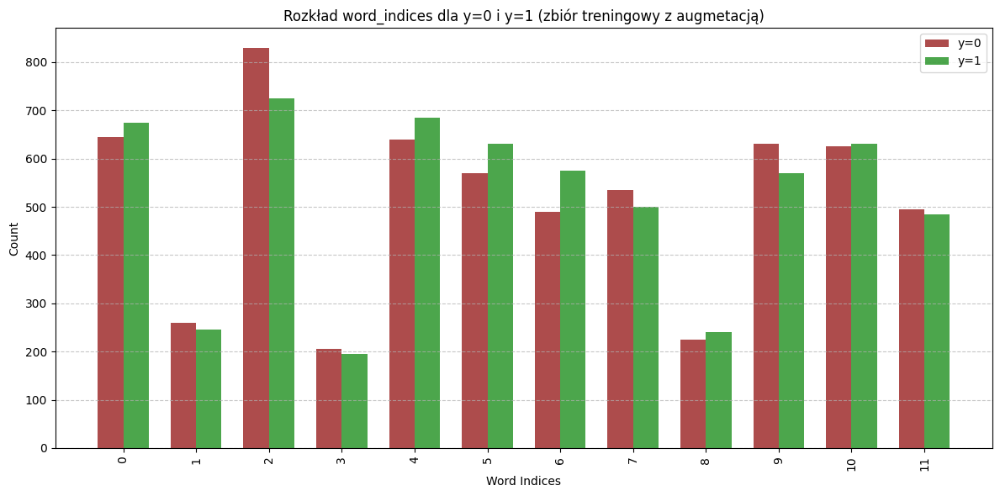

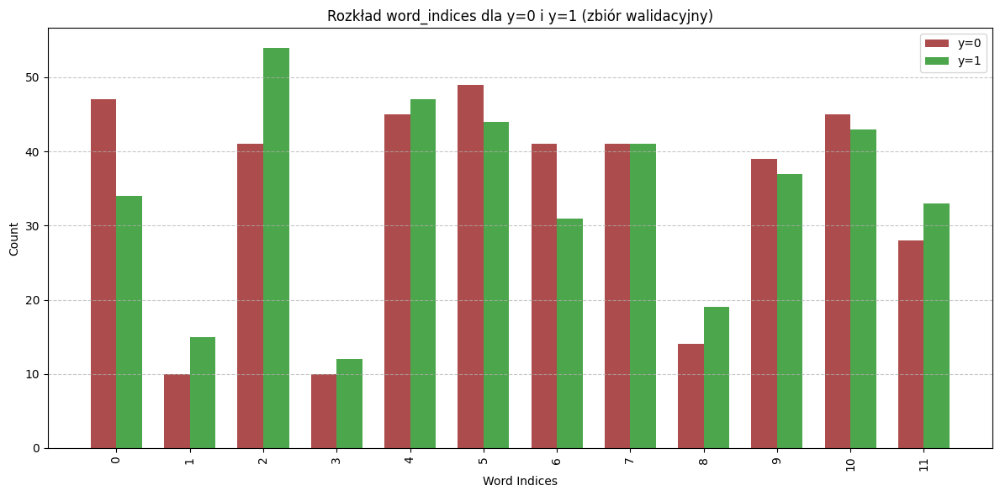

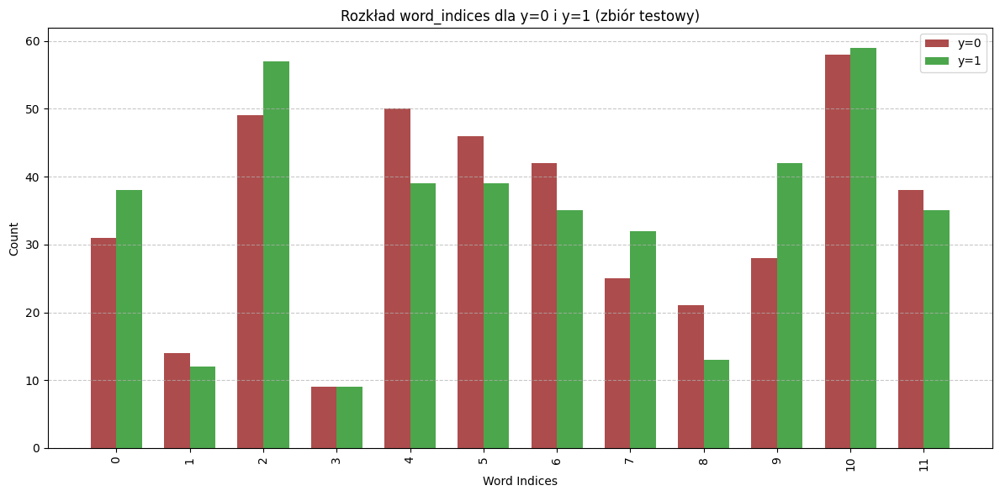

In [89]:
# Funkcja do wizualizacji rozkładu word_indices dla każdej klasy (y)
def plot_word_indices_grouped(word_indices, y, title):
    unique_word_indices = np.unique(word_indices)
    unique_labels = np.unique(y)
    word_label_counts = {word: {label: 0 for label in unique_labels} for word in unique_word_indices}
    for word, label in zip(word_indices, y):
        word_label_counts[word][label] += 1
    bar_width = 0.35
    index = np.arange(len(unique_word_indices))
    counts_class_0 = [word_label_counts[word][0] for word in unique_word_indices]
    counts_class_1 = [word_label_counts[word][1] for word in unique_word_indices]
    plt.figure(figsize=(12, 6))
    plt.bar(index - bar_width / 2, counts_class_0, bar_width, label='y=0', color='darkred', alpha=0.7)
    plt.bar(index + bar_width / 2, counts_class_1, bar_width, label='y=1', color='green', alpha=0.7)
    plt.xlabel('Word Indices')
    plt.ylabel('Count')
    plt.title(title)
    plt.xticks(index, unique_word_indices, rotation=90)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

plot_word_indices_grouped(word_indices_train, y_train, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy)")
plot_word_indices_grouped(word_indices_train_with_augmented, y_train_with_augmented, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy z augmetacją)")
plot_word_indices_grouped(word_indices_val, y_val, "Rozkład word_indices dla y=0 i y=1 (zbiór walidacyjny)")
plot_word_indices_grouped(word_indices_test, y_test, "Rozkład word_indices dla y=0 i y=1 (zbiór testowy)")


### Save data

In [90]:
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
save_dir = os.path.join(data_dir, timestamp)
subsets = ["train", "val", "test"]
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_with_augmented, "y_train": y_train_with_augmented, "word_train": word_indices_train_with_augmented}, save_dir, "train")
save_data({"X_val": X_val, "y_val": y_val, "word_val": word_indices_val}, save_dir, "val")
save_data({"X_test": X_test, "y_test": y_test, "word_test": word_indices_test}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20241203_205926
